# define 

In [1]:
class style:
    RESET = "\033[0m"
    BOLD = "\033[1m"
    DIM = "\033[2m"
    UDLINE = "\033[4m"
    BLINK = "\033[5m"
    INVERT = "\033[7m"
    HIDDEN = "\033[8m"


class bg(style):
    RED = "\033[41m"
    YELLOW = "\033[43m"
    LRED = "\033[101m"
    LYELLOW = "\033[103m"


class fg(style):
    BLACK = "\033[30m"
    RED = "\033[31m"
    GREEN = "\033[32m"
    YELLOW = "\033[33m"
    BLUE = "\033[34m"
    LRED = "\033[91m"
    LGREEN = "\033[92m"
    LYELLOW = "\033[93m"
    LBLUE = "\033[94m"
    LMAGENTA = "\033[95m"
    LCYAN = "\033[96m"
    WHITE = "\033[97m"

# 데이터 전처리

In [2]:
import pandas as pd
import pandas.core.frame
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv("https://bit.ly/telco-csv", index_col="customerID")

print(df.info())
df.head(3)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null 

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes


In [3]:
def data_check_null(df: pandas.core.frame.DataFrame) -> int:
    """
    ### param
    df: pandas.core.frame.DataFrame
    ### return
    null_count : int
    ### brief
    DataFrame 안에 null갯수를 확인하는 함수 입니다
    """
    print(fg.LMAGENTA, "🚀 NULL Check", fg.RESET, sep="")
    if df.isnull().sum().sum():
        print(
            fg.LRED,
            "null check ",
            df.isnull().sum(),
            " Total",
            df.isnull().sum(),
            fg.RESET,
            sep="",
        )
    else:
        print(fg.LGREEN, "OK", fg.RESET, sep="")
    return df.isnull().sum().sum()


def data_check_object(df: pandas.core.frame.DataFrame, data=""):
    """
    ### param
    df: pandas.core.frame.DataFrame
    data: str = ""
    ### return
    None
    ### brief
    양측 공백을 제거하고 특정 문자를 찾는 함수 입니다.
    """
    df_object = df.select_dtypes(["object"])
    isclear = True
    print(fg.LMAGENTA, "🚀 '" + data + "' Check" + fg.RESET, sep="")
    for column in df_object.columns:
        if np.where(df_object[column].str.strip() == data)[0].size:
            isclear = False
            print(
                fg.LYELLOW + df_object[column].name + fg.RESET,
                " : ",
                np.where(df_object[column].str.strip() == data),
                sep="",
            )
    print(fg.LGREEN, "OK", sep="") if isclear else print(fg.LRED, "Not Clear", sep="")


data_check_null(df)
data_check_object(df)

🚀 NULL Check
OK
🚀 '' Check
TotalCharges : (array([ 488,  753,  936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754]),)
Not Clear


In [4]:
df["TotalCharges"] = df["TotalCharges"].str.strip().replace("", np.nan)
data_check_null(df)
data_check_object(df)

🚀 NULL Check
null check gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64 Totalgender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64
🚀 '' Check
OK


In [5]:
df = df.dropna()
data_check_null(df)
data_check_object(df)

🚀 NULL Check
OK
🚀 '' Check
OK


In [6]:
def show_unique(df: pandas.core.frame.DataFrame):
    """
    ### param
    df: pandas.core.frame.DataFrame
    data: str = ""
    ### return
    None
    ### brief
    데이터 프레임의 유니크 벨류를 보는 함수
    """
    print(fg.LMAGENTA, "🚀 unique values" + fg.RESET, sep="")
    for column in df.columns:
        print(
            fg.LYELLOW + df[column].name + fg.GREEN,
            " [" + str(df[column].nunique()) + "]",
            fg.RESET,
            " : ",
            df[column].unique(),
            sep="",
        )
    print(fg.LGREEN, "OK", sep="")


show_unique(df)

🚀 unique values
gender [2] : ['Female' 'Male']
SeniorCitizen [2] : [0 1]
Partner [2] : ['Yes' 'No']
Dependents [2] : ['No' 'Yes']
tenure [72] : [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26 39]
PhoneService [2] : ['No' 'Yes']
MultipleLines [3] : ['No phone service' 'No' 'Yes']
InternetService [3] : ['DSL' 'Fiber optic' 'No']
OnlineSecurity [3] : ['No' 'Yes' 'No internet service']
OnlineBackup [3] : ['Yes' 'No' 'No internet service']
DeviceProtection [3] : ['No' 'Yes' 'No internet service']
TechSupport [3] : ['No' 'Yes' 'No internet service']
StreamingTV [3] : ['No' 'Yes' 'No internet service']
StreamingMovies [3] : ['No' 'Yes' 'No internet service']
Contract [3] : ['Month-to-month' 'One year' 'Two year']
PaperlessBilling [2] : ['Yes' 'No']
PaymentMethod [4] : ['Electronic check' 'Mailed check' 'Bank transfer (automatic

In [7]:
def data_make_bool(
    df: pandas.core.frame.DataFrame, columns: list[str], value_true: list[any]
):
    """
    ### param
    df: pandas.core.frame.DataFrame
    columns: list[str]
    value_true: list[any]
    ### return
    new_df: pandas.core.frame.DataFrame
    ### brief
    데이터를 boolean 변경하는 함수
    """
    print(fg.LMAGENTA, "🚀 make values bool" + fg.RESET, sep="")
    if len(columns) != len(value_true):
        print(
            fg.LRED + "arg is diff len\n" + fg.RESET,
            "columns" + fg.GREEN + "[" + str(len(columns)) + "]" + fg.RESET,
            " != ",
            "value_true" + fg.GREEN + "[" + str(len(value_true)) + "]" + fg.RESET,
            sep="",
        )
    new_df = df.copy(deep=True)
    for idx, column in enumerate(columns):
        new_df[column] = (new_df[column] == value_true[idx]).astype(bool)
    print(fg.LGREEN, "OK", sep="")
    return new_df


def data_make_number(
    df: pandas.core.frame.DataFrame, columns: list[str], value_index: list[list[any]]
):
    """
    ### param
    df: pandas.core.frame.DataFrame
    columns: list[str]
    value_index: list[list[any]]
    ### return
    new_df: pandas.core.frame.DataFrame
    ### brief
    데이터를 number 변경하는 함수
    """
    print(fg.LMAGENTA, "🚀 make values number" + fg.RESET, sep="")
    if len(columns) != len(value_index):
        print(
            fg.LRED + "arg is diff len\n" + fg.RESET,
            "columns" + fg.GREEN + "[" + str(len(columns)) + "]" + fg.RESET,
            " != ",
            "value_index" + fg.GREEN + "[" + str(len(value_index)) + "]" + fg.RESET,
            sep="",
        )
    new_df = df.copy(deep=True)
    for column_idx, column in enumerate(columns):
        for value_idx, value in enumerate(value_index[column_idx]):
            new_df[column] = new_df[column].replace(value, value_idx)
        try:
            new_df[column] = new_df[column].astype(float)
        except:
            print(fg.LRED + "some value is not catched" + fg.RESET)
            return df
    print(fg.LGREEN, "OK", sep="")
    return new_df


# data_make_bool(
#     df,
#     [
#         "gender",
#         "SeniorCitizen",
#         "Partner",
#         "Dependents",
#         "PhoneService",
#         "PaperlessBilling",
#         "Churn",
#     ],
#     ["Male", 1, "Yes", "Yes", "Yes", "Yes", "Yes"],
# )

df = data_make_number(
    df,
    [
        "gender",
        "SeniorCitizen",
        "Partner",
        "Dependents",
        "PhoneService",
        "PaperlessBilling",
    ],
    [
        ["Female", "Male"],
        [0, 1],
        ["No", "Yes"],
        ["No", "Yes"],
        ["No", "Yes"],
        ["No", "Yes"],
    ],
)
show_unique(df)

🚀 make values number
OK
🚀 unique values
gender [2] : [0. 1.]
SeniorCitizen [2] : [0. 1.]
Partner [2] : [1. 0.]
Dependents [2] : [0. 1.]
tenure [72] : [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26 39]
PhoneService [2] : [0. 1.]
MultipleLines [3] : ['No phone service' 'No' 'Yes']
InternetService [3] : ['DSL' 'Fiber optic' 'No']
OnlineSecurity [3] : ['No' 'Yes' 'No internet service']
OnlineBackup [3] : ['Yes' 'No' 'No internet service']
DeviceProtection [3] : ['No' 'Yes' 'No internet service']
TechSupport [3] : ['No' 'Yes' 'No internet service']
StreamingTV [3] : ['No' 'Yes' 'No internet service']
StreamingMovies [3] : ['No' 'Yes' 'No internet service']
Contract [3] : ['Month-to-month' 'One year' 'Two year']
PaperlessBilling [2] : [1. 0.]
PaymentMethod [4] : ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 

🚀 show values count


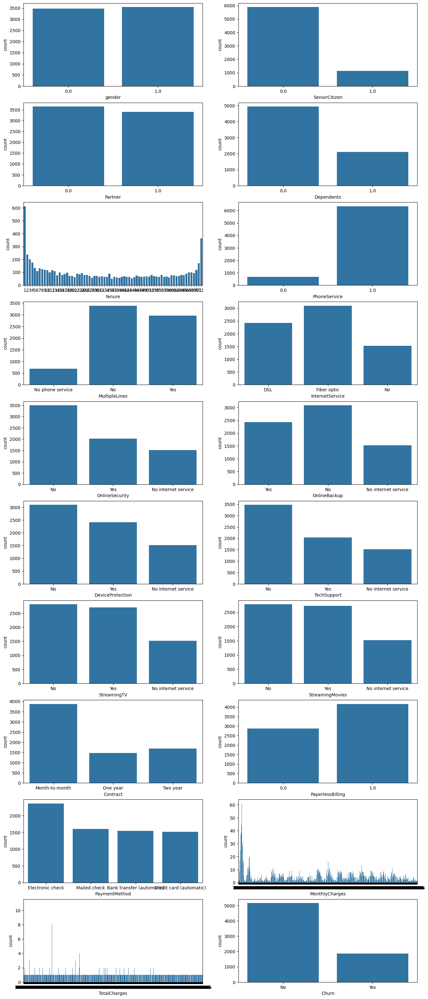

Churn
No     0.734215
Yes    0.265785
Name: proportion, dtype: float64


In [8]:
def show_value_count(df: pandas.core.frame.DataFrame):
    """
    ### param
    df: pandas.core.frame.DataFrame
    ### return
    None
    ### brief
    데이터 벨류 비율을 보는 함수
    """
    print(fg.LMAGENTA, "🚀 show values count" + fg.RESET, sep="")
    fig, ax = plt.subplots(
        len(df.columns) // 2, 2, figsize=(16, len(df.columns) // 2 * 4)
    )
    for idx, column in enumerate(df.columns):
        sns.countplot(data=df, x=column, ax=ax[idx // 2, idx % 2])
    plt.show(fig)


show_value_count(df)
print(df["Churn"].value_counts(normalize=True))

# 학습 데이터셋 나누기

In [9]:
feature_names = sorted(df.select_dtypes(include="number").columns)
label_name = "Churn"

X = df[feature_names]
y = df[label_name]

split_cout = int(df.shape[0] * 0.8)

X_train = X[:split_cout]
y_train = y[:split_cout]

X_test = X[split_cout:]
y_test = y[split_cout:]

# 모델 학습 & 예측

In [10]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier()

model.fit(X_train, y_train)

result = model.predict(X_test)
result

array(['Yes', 'Yes', 'No', ..., 'No', 'No', 'No'], dtype=object)

# 시각화

In [11]:
from sklearn.tree import plot_tree

plt.figure(figsize=(400, 40))
tree = plot_tree(model, feature_names=feature_names, filled=True, fontsize=10)

In [12]:
from sklearn.tree import export_text

print(export_text(model, max_depth=3))

|--- feature_7 <= 16.50
|   |--- feature_1 <= 69.22
|   |   |--- feature_7 <= 2.50
|   |   |   |--- feature_1 <= 20.85
|   |   |   |   |--- truncated branch of depth 17
|   |   |   |--- feature_1 >  20.85
|   |   |   |   |--- truncated branch of depth 19
|   |   |--- feature_7 >  2.50
|   |   |   |--- feature_1 <= 27.43
|   |   |   |   |--- truncated branch of depth 16
|   |   |   |--- feature_1 >  27.43
|   |   |   |   |--- truncated branch of depth 22
|   |--- feature_1 >  69.22
|   |   |--- feature_7 <= 1.50
|   |   |   |--- feature_1 <= 75.68
|   |   |   |   |--- truncated branch of depth 15
|   |   |   |--- feature_1 >  75.68
|   |   |   |   |--- truncated branch of depth 11
|   |   |--- feature_7 >  1.50
|   |   |   |--- feature_1 <= 73.53
|   |   |   |   |--- truncated branch of depth 11
|   |   |   |--- feature_1 >  73.53
|   |   |   |   |--- truncated branch of depth 17
|--- feature_7 >  16.50
|   |--- feature_1 <= 69.97
|   |   |--- feature_1 <= 28.55
|   |   |   |--- feature

[0.03201488 0.50884859 0.0302194  0.04111651 0.00757265 0.02595718
 0.03974062 0.31453016]


<Axes: >

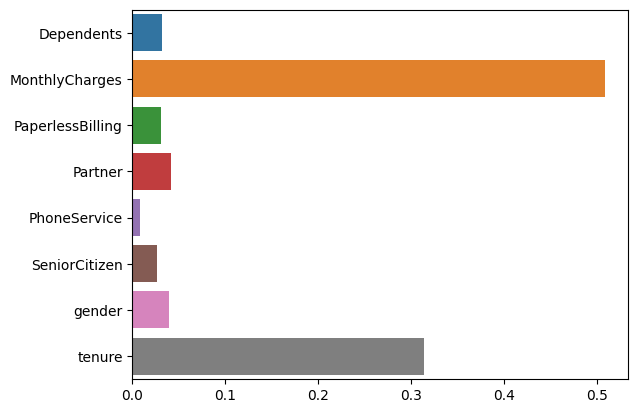

In [13]:
print(model.feature_importances_)

sns.barplot(x=model.feature_importances_, y=feature_names, hue=feature_names)

# 정확도

In [14]:
from sklearn.metrics import accuracy_score

print(
    fg.LMAGENTA + "🎉 accuracy : " + fg.RESET,
    fg.BOLD + fg.LYELLOW,
    accuracy_score(y_test, result) * 100 // 1,
    fg.RESET,
    "% \n",
    fg.LCYAN + "✨🎖️ CongratulationsCongratulations 🎖️✨" + fg.RESET,
    sep="",
)

🎉 accuracy : 71.0% 
✨🎖️ CongratulationsCongratulations 🎖️✨
